 <h1 align="center"><font size="5">Graph Networks</font></h1>

<h1 align="center"><font size="4">Cora Dataset - EDA for Graph Node Prediction</font></h1>

<div class="alert alert-info"><p>


This is the first of a series of notebooks that will explore the datasets for node and graph classification and link prediction. The dataset explored here is the Cora Dataset from the Planetoid citations network, which will be downloaded from the torch_geometric library.
</p></div>

### Table of Contents





---

1. [Introduction](#introduction)
2. [Setup and Imports](#setup-and-imports)
3. [Load Dataset](#load-dataset)
4. [Graph-Level Statistics](#graph-level-statistics)
5. [Graph Visualization](#graph-visualization)
6. [Node Distribution](#node-distribution)
7. [Train, Validation, Test Splits node distribution](#train-validation-test-splits)
8. [References](#references)


<a id="introduction"></a>

## 1. Introduction

---


**Cora** is a citation network from the Planetoid benchmark suite [1]. It contains **2,708** scientific publications, each assigned to exactly one of **seven** topics, linked by **5,429** citations (**10,556** directed edges once symmetrized).

- **Nodes** — academic papers. Each is described by a 1,433-dimensional binary bag-of-words vector, where each entry marks the absence (0) or presence (1) of one word from a fixed dictionary.
- **Edges** — citation links between papers. The graph is treated as undirected.
- **Labels** — the research topic of the paper. Labels are *sparse*: only 140 nodes (~5%) are labelled for training, so a model has to exploit the graph structure to classify the rest. This is what makes Cora a semi-supervised learning benchmark.

#### Node classes (paper topics)

| Label | Topic                  |
|:-----:|:-----------------------|
|   1   | Theory                 |
|   2   | Reinforcement Learning |
|   3   | Genetic Algorithms     |
|   4   | Neural Networks        |
|   5   | Probabilistic Methods  |
|   6   | Case Based             |
|   7   | Rule Learning          |

#### Tasks benchmarked on Cora

- **Node classification** — predict the topic of a paper from its word features and its position in the citation graph. Graph Convolutional Networks (GCNs) and Graph Attention Networks (GATs) are the standard baselines.
- **Link prediction** — infer missing links or future citations between papers, i.e. score the likelihood of a connection between two nodes.
- **Clustering / community detection** — group papers with similar properties. Cora's community structure makes it a natural testbed for identifying groupings within the network.

This notebook covers the exploratory analysis only: loading the graph, inspecting its structural properties, visualizing it, and checking the class balance across the train, validation, and test splits.

>Note: This notebook is based on the PyG (PyTorch Geometric) documentation [2].
> The numerical labels for the topics are converted to the types of papers on the Dataset - for python label categories from 0 to 6.


<a id="setup-and-imports"></a>

## 2. Setup and Imports

In [1]:
# Stdlib
from pathlib import Path
from collections import Counter

# Numeric
import numpy as np
import torch

# Graph
from torch_geometric.datasets import Planetoid

# Plotting
import altair as alt

# global altair config — must run once before any chart is displayed
alt.data_transformers.enable("vegafusion")
alt.renderers.enable("svg")

# If running this notebook on JupyterLab, Jupyter Notebook, VSCode-Python, or Colab, uncomment the line below
# alt.renderers.enable("jupyter")
# alt.renderers.enable("html") - uncomment for interactive plots

RendererRegistry.enable('svg')

<a id="load-dataset"></a>

## 3. Load Dataset

In [2]:
from torch_geometric.data.data import Data

In [3]:
# Define PyTorch Geometric dataset path and name.
data_path = "data"
dataset_name = "Cora"
path_to_dataset = Path.cwd().parent / data_path / dataset_name

if path_to_dataset.exists():
    # Path(f'{data_path}/{dataset_name}').exists()):
    print("Dataset already downloaded")
    print(".....Loading dataset from disk....")
    # Load the dataset from disk and convert it to a PyTorch Geometric Data object
    raw = torch.load(f'{path_to_dataset}/Cora/processed/data.pt')[0]
    graph = Data(x=raw['x'], edge_index=raw['edge_index'], y=raw['y'], train_mask=raw['train_mask'],
                 test_mask=raw['test_mask'], val_mask=raw['val_mask'])
else:
    print("...Downloading dataset...")
    dataset = Planetoid(root=str(path_to_dataset), name='Cora')
    graph = dataset[0]
    print(f'Number of graphs: {len(dataset)}')

...Downloading dataset...


Number of graphs: 1


Processing...
Done!


Information about all parameters of the data object is a container is available here:
[PYG](https://pytorch-geometric.readthedocs.io/en/latest/generated/torch_geometric.data.Data.html#torch_geometric.data.Data)

**The parameters are**:
* **x** (torch.Tensor, optional) – Node feature matrix with shape [num_nodes, num_node_features]. (default: None)
* **edge_index** (LongTensor, optional) – Graph connectivity in COO format with shape [2, num_edges]. (default: None)
* **edge_attr** (torch.Tensor, optional) – Edge feature matrix with shape [num_edges, num_edge_features]. (default: None)
* **y** (torch.Tensor, optional) – Graph-level or node-level ground-truth labels with arbitrary shape. (default: None)
* **pos** (torch.Tensor, optional) – Node position matrix with shape [num_nodes, num_dimensions]. (default: None)
* **tim**e (torch.Tensor, optional) – The timestamps for each event with shape [num_edges] or [num_nodes]. (default: None)
* **kwargs** (optional) – Additional attributes.
* And **num_nodes** (property)

Below are some examples of how this parameter can be accessed:
- `data.x:`
- `data.edge_index`
- `data.edge_attr:`
- `data.y:`

<a id="graph-level-statistics"></a>

## 4. Graph-Level Statistics

This section will compute some statistics about the graph. Some traditional metrics include: density, numer of nodes, number of edges, self-nodes, average node degree, number of connected components, number of classes, etc. Here we wil also compute the homiphily and assortativity metrics and the degree spread. The homophily and assortativity metrics are computed using the `torch_geometric.utils` library and the degree spread is computed using the `scipy.sparse.csgraph` library. There are three types of homophily metrics in the torch library. Below we provide the definition of homophily and the assortativity [2].

Homophily:
- **Edge homophily** ratio is the fraction of edges in a graph which connects nodes that have the same class label
- **Node homophily** ration is the edge homophily normalized across neighbourhoods
- **Insensitive edge homophily** ratio edge homophily is modified to be insensitive to the number of classes and size of each class
- **Assortativity** coefficient in a network refers to the tendency of nodes to connect with other similar nodes over dissimilar nodes.

https://pytorch-geometric.readthedocs.io/en/latest/modules/utils.html?highlight=homophily#torch_geometric.utils.homophily


In [4]:
# Get the imports to compute the statistics
from torch_geometric.utils import homophily, assortativity
from torch_geometric.utils import degree
from scipy.sparse.csgraph import connected_components
from torch_geometric.utils import to_scipy_sparse_matrix

In [5]:
# Homophily
edge_homo = homophily(graph.edge_index, graph.y, method='edge')
node_homo = homophily(graph.edge_index, graph.y, method='node')
edge_in_homo = homophily(graph.edge_index, graph.y, method='edge_insensitive')

# Assortativity
graph_assort = assortativity(graph.edge_index)

# Degree spread
deg = degree(graph.edge_index[0], num_nodes=graph.num_nodes)

# Connectivity
adj = to_scipy_sparse_matrix(graph.edge_index, num_nodes=graph.num_nodes)
n_comp, labels = connected_components(adj, directed=False)
largest_conn = int(np.bincount(labels).max())

# Density
density = graph.num_edges / (graph.num_nodes * (graph.num_nodes - 1))


In [6]:
# Mapping numerical labels to types of papers on the Dataset - for python label categories from 0 to 6
label_map = {
    0: "Theory",
    1: "Reinforcement Learning",
    2: "Genetic Algorithms",
    3: "Neural Networks",
    4: "Probabilistic Methods",
    5: "Case Based",
    6: "Rule Learning"}

In [7]:
# Gather some statistics about the graph.
print('=================================================')

print(f'Number of nodes: {graph.num_nodes}')
print(f'Node types: {len(np.unique(graph.y))}')
print(f'Number of node features: {graph.num_node_features}')
print(f'Number of edges: {graph.num_edges}')
print(f'Density: {density:.6f}')
print(f'Node degree min / max / mean / std: {int(deg.min())} / {int(deg.max())} / {deg.mean():.2f} / {deg.std():.2f}')
print(f'Average node degree: {graph.num_edges / graph.num_nodes:.2f}')
print(f'Edge homophily: {edge_homo:.2f}')
print(f'Node homophily: {node_homo:.2f}')
print(f'Insensitivity edge homophily: {edge_in_homo:.2f}')
print(f'Has isolated nodes: {graph.has_isolated_nodes()}')
print(f'Has self-loops: {graph.has_self_loops()}')
print(f'Is undirected: {graph.is_undirected()}')
print(f'Connected components: {n_comp}')
print(f'Largest component size: {largest_conn}, ({largest_conn / graph.num_nodes:.2f} of nodes)')
print(f'Assortativity: {graph_assort:.2f}')

# Train / Val / test masks
print(f'Number of training nodes: {graph.train_mask.sum()}')
print(f'Training node label rate: {int(graph.train_mask.sum()) / graph.num_nodes:.2f}')
print(f'Number of validation nodes: {int(graph.val_mask.sum())}')
print(f'Number of test nodes: {int(graph.test_mask.sum())}')

Number of nodes: 2708
Node types: 7
Number of node features: 1433
Number of edges: 10556
Density: 0.001440
Node degree min / max / mean / std: 1 / 168 / 3.90 / 5.23
Average node degree: 3.90
Edge homophily: 0.81
Node homophily: 0.83
Insensitivity edge homophily: 0.77
Has isolated nodes: False
Has self-loops: False
Is undirected: True
Connected components: 78
Largest component size: 2485, (0.92 of nodes)
Assortativity: -0.07
Number of training nodes: 140
Training node label rate: 0.05
Number of validation nodes: 500
Number of test nodes: 1000


These metrics also can be computed by calling the method `GraphEDA` from the source code. See on the cell below.

In [8]:
from src.common.graph_eda import GraphEDA

stats = GraphEDA(graph, label_map)
stats.summary()

=== Graph structure ===
Number of nodes: 2708
Number of edges: 10556
Number of node features: 1433
Number of classes: 7
Graph density: 0.001440

=== Degree ===
Average node degree: 3.90
Degree min / max / std: 1 / 168 / 5.23

=== Class balance ===
Theory: 351 (12.96%)
Reinforcement Learning: 217 (8.01%)
Genetic Algorithms: 418 (15.44%)
Neural Networks: 818 (30.21%)
Probabilistic Methods: 426 (15.73%)
Case Based: 298 (11.00%)
Rule Learning: 180 (6.65%)

=== Homophily / mixing ===
Edge homophily: 0.81
Node homophily: 0.83
Edge-insensitive homophily: 0.77
Degree assortativity: -0.07

=== Connectivity ===
Connected components: 78
Largest component: 2485 (91.77% of nodes)
Has isolated nodes: False
Has self-loops: False
Is undirected: True

=== Splits ===
Training nodes: 140 (label rate 0.05)
Validation nodes: 500
Test nodes: 1000


<a id="graph-visualization"></a>

## 5. Graph Visualization

In this section we would visualize the graph node distribution with different amount of node sampling. We would use the spring and atlas 2 algorithm to render the visualization.

In [9]:
from src.common.altair_plots import convert_to_networkx, plot_label_distribution, compute_layout, plot_graph

In [10]:
figs_dir = Path.cwd().parent / "outputs" / "figures" / "cora"

In [11]:
# Convert graph to networkx
G = convert_to_networkx(graph, n_sample=1500, label_dict=label_map)
# Compute the graph layout
pos = compute_layout(G, graph_type='forceatlas2')
plot_graph(G, pos, node_tooltip=["paper_topic"], node_size=100, node_label=None, edge_width=0.8, edge_legend=None,
           alpha=0.8, curved_edges=True, path_to_plots=figs_dir, plot_name='cora_graph_atlas2', cmap="tableau10")

In [12]:
pos = compute_layout(G, graph_type='spring')
plot_graph(G, pos, node_tooltip=["paper_topic"], node_size=100, node_label=None,
           edge_width=0.8, edge_legend=None, alpha=0.8, curved_edges=True, path_to_plots=figs_dir,
           plot_name='cora_graph_spring', cmap="tableau10")

<a id="node-distribution"></a>



## 6. Node Distribution


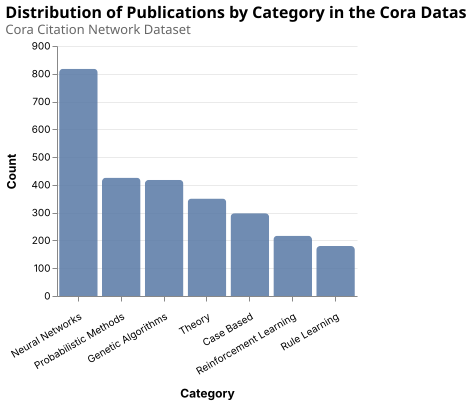

In [15]:
plot_label_distribution(graph.y, path_to_graph=figs_dir, graph_name='data_dist',
                        label_dict=label_map, title="Distribution of Publications by Category in the Cora Dataset",
                        subtitle="Cora Citation Network Dataset", split="")

<a id="train-validation-test-splits"></a>


## 7. Train, Validation, Test Splits node distribution

In [14]:
print("====== Total samples per split ======")
print(
    f"train: {int(graph.train_mask.sum())}, ",
    f"val: {int(graph.val_mask.sum())}, ",
    f"test: {int(graph.test_mask.sum())}",
)

====== Total samples per split ======
train: 140,  val: 500,  test: 1000


In [16]:
class_counts = Counter(graph.y.tolist())
print("====== Class counts  ======")
print({label_map[k]:v for k,v in class_counts.items()})

====== Class counts  ======
{'Neural Networks': 818, 'Probabilistic Methods': 426, 'Theory': 351, 'Genetic Algorithms': 418, 'Reinforcement Learning': 217, 'Case Based': 298, 'Rule Learning': 180}


In [17]:
graph_params = {"plots_path": figs_dir, "name": 'cora_train_data_dist', "label_dict": label_map, "title": "Distribution of Publications by Category in the Cora Dataset",
                "subtitle": "Cora Citation Network Dataset", "split": "Train"}

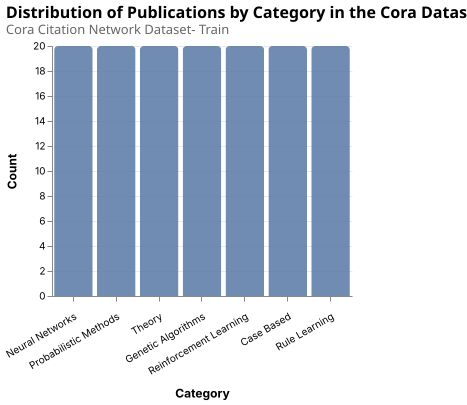

In [18]:
plot_label_distribution(graph.y[graph.train_mask], path_to_graph=graph_params['plots_path'],
                        graph_name=str(graph_params['name']), label_dict=graph_params['label_dict'],
                        title=graph_params['title'], subtitle=str(graph_params['subtitle']),
                        split=str(graph_params['split']))

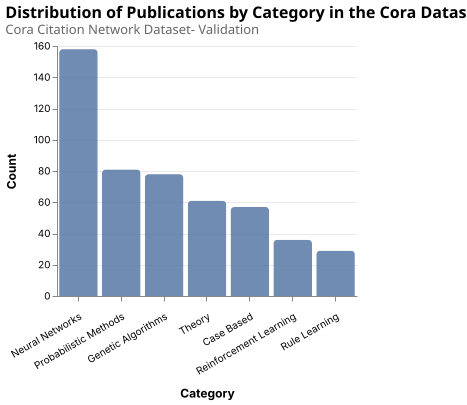

In [19]:
plot_label_distribution(graph.y[graph.val_mask], path_to_graph=graph_params['plots_path'],
                        graph_name='val_data_dist', label_dict=graph_params['label_dict'],
                        title=graph_params['title'], subtitle=str(graph_params['subtitle']),
                        split="Validation")

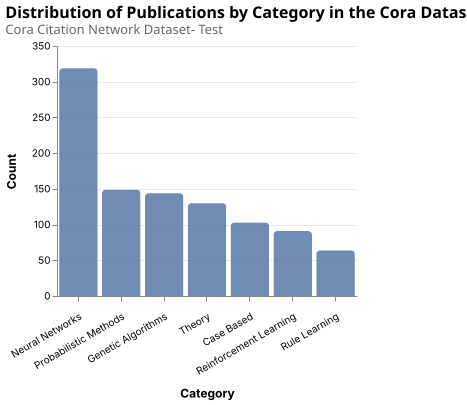

In [20]:
plot_label_distribution(graph.y[graph.test_mask], path_to_graph=graph_params['plots_path'],
                        graph_name='test_data_dist', label_dict=graph_params['label_dict'],
                        title=graph_params['title'], subtitle=str(graph_params['subtitle']),
                        split="Test")

<a id="references"></a>
## 8. References

---

[1] Z. Yang, W. W. Cohen, and R. Salakhutdinov, "Revisiting semi-supervised learning with graph embeddings," in *Proc. 33rd Int. Conf. Machine Learning (ICML)*, New York, NY, USA, 2016, pp. 40–48. [arXiv:1603.08861](https://arxiv.org/abs/1603.08861)

[2] *PyG (PyTorch Geometric) documentation*. [pytorch-geometric.readthedocs.io](https://pytorch-geometric.readthedocs.io/en/latest/index.html#pyg-documentation)
